In [12]:
%%capture
!pip install ultralytics roboflow pyyaml tqdm --quiet

import os, shutil, json, yaml, time, csv
from pathlib import Path
from tqdm import tqdm
import numpy as np
import cv2
from IPython.display import display, Image as IPImage
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from ultralytics import YOLO
from roboflow import Roboflow
from collections import Counter
import torch, subprocess, sys
import importlib, torch
import pandas as pd
import zipfile

print(" All dependencies installed")
print(f"   Ultralytics YOLO ready")


In [16]:
# ─── USER SETTINGS — edit these ──────────────────────────────────────────────
ROBOFLOW_API_KEY = "AX0EiHDx1qON78ihxKQZ"   # ← paste your key

MODEL_VARIANT    = "yolov8m.pt"    # upgraded to medium: larger backbone generalises across temple styles
EPOCHS           = 20             # more epochs needed for diverse multi-region dataset              
IMAGE_SIZE       = 640             # 640 or 1280 for higher accuracy
BATCH_SIZE       = 32             
CONF_THRESHOLD   = 0.35            # Lowered: damaged/weathered temples have weaker activations
PADDING_ALPHA    = 0.12            # Crop padding ratio (12% for temples)
# ─────────────────────────────────────────────────────────────────────────────

# Unified class schema
# Collapsed to single class — model detects everything as "temple"
UNIFIED_CLASSES   = ["temple"]
CLASS_TO_IDX      = {c: i for i, c in enumerate(UNIFIED_CLASSES)}

# Directories
BASE_DIR    = Path("/kaggle/working")
RAW_DIR     = BASE_DIR / "data/raw"
MERGED_DIR  = BASE_DIR / "data/merged"
CROPS_DIR   = BASE_DIR / "outputs/crops"
REPORT_DIR  = BASE_DIR / "outputs/reports"

for d in [RAW_DIR, MERGED_DIR, CROPS_DIR, REPORT_DIR]:
    d.mkdir(parents=True, exist_ok=True)

SPLITS = ["train", "valid", "test"]
print("  Configuration set")
print(f"   Model    : {MODEL_VARIANT}")
print(f"   Epochs   : {EPOCHS}")
print(f"   Image sz : {IMAGE_SIZE}")
print(f"   Classes  : {UNIFIED_CLASSES}")


  Configuration set
   Model    : yolov8s.pt
   Epochs   : 10
   Image sz : 640
   Classes  : ['temple', 'building', 'monument']


In [3]:
# ─── DATASET SOURCES ─────────────────────────────────────────────────────────
# Covers: Nepali pagoda, South Indian gopuram, Thai wat, Balinese pura,
#         Japanese shrine/pagoda, Cambodian/Angkor, Chinese temple,
#         generic heritage/religious-building datasets.
# Every class from every dataset remaps to "temple" — style doesn't matter.
# ─────────────────────────────────────────────────────────────────────────────
DATASETS = [
    # ── Kathmandu / Nepali heritage (your original 4) ────────────────────────
    {
        "workspace": "new-kathmandu-drubar-square",
        "project":   "heritage-detector-oe4cm",
        "version":   1,
        "alias":     "kathmandu_durbar_1",
        "class_remap": {
            "temple": "temple", "building": "temple", "monument": "temple",
            "stupa": "temple", "pagoda": "temple", "heritage": "temple",
            "shrine": "temple", "mandir": "temple", "structure": "temple",
        },
    },
    {
        "workspace": "monument-classification",
        "project":   "monument-detection-24ztr",
        "version":   1,
        "alias":     "monument_detection",
        "class_remap": {
            "monument": "temple", "temple": "temple",
            "building": "temple", "shrine": "temple",
        },
    },
    {
        "workspace": "new-1kathmandu-durbar-square",
        "project":   "heritage-detection-js2qw",
        "version":   1,
        "alias":     "kathmandu_durbar_2",
        "class_remap": {
            "temple": "temple", "building": "temple",
            "heritage": "temple", "structure": "temple",
        },
    },
    {
        "workspace": "makeathon",
        "project":   "temples",
        "version":   1,
        "alias":     "temples_makeathon",
        "class_remap": {
            "temple": "temple", "building": "temple", "monument": "temple",
            "mandir": "temple", "stupa": "temple",
        },
    },

    # ── South Asian / global religious architecture ───────────────────────────
    {
        "workspace": "religious-buildings",
        "project":   "temple-detection",
        "version":   1,
        "alias":     "temple_detection_global",
        "class_remap": {
            "temple": "temple", "church": "temple", "mosque": "temple",
            "shrine": "temple", "pagoda": "temple", "stupa": "temple",
            "building": "temple", "religious": "temple",
        },
    },
    {
        "workspace": "heritage-sites",
        "project":   "world-heritage-detection",
        "version":   1,
        "alias":     "world_heritage",
        "class_remap": {
            "temple": "temple", "monument": "temple", "heritage": "temple",
            "structure": "temple", "building": "temple",
        },
    },
    {
        "workspace": "landmark-detection",
        "project":   "asian-landmarks",
        "version":   1,
        "alias":     "asian_landmarks",
        "class_remap": {
            "temple": "temple", "pagoda": "temple", "shrine": "temple",
            "landmark": "temple", "building": "temple",
        },
    },
]

# ─────────────────────────────────────────────────────────────────────────────
# NOTE: The 3 additional datasets above (religious-buildings, heritage-sites,
# asian-landmarks) are placeholder workspace/project slugs. Replace them with
# real Roboflow dataset slugs you find at roboflow.com/explore — search for:
#   "temple detection", "gopuram", "wat", "shrine", "pagoda", "angkor"
# The merge logic below works identically for any YOLOv8-format dataset.
# If a dataset fails to download it is skipped automatically.
# ─────────────────────────────────────────────────────────────────────────────

# FULL-IMAGE FALLBACK BOX
# For any image with no usable annotations after remapping, write a box
# covering the entire image (class 0, temple). Prevents YOLO from treating
# unannotated temple images as hard negatives.
FULL_IMAGE_BOX = "0 0.5 0.5 1.0 1.0"

def load_dataset_classes(dataset_dir):
    yaml_path = dataset_dir / "data.yaml"
    if not yaml_path.exists():
        return []
    with open(yaml_path) as f:
        cfg = yaml.safe_load(f)
    return cfg.get("names", [])

def remap_label_file(src_label, dst_label, original_classes, class_remap):
    """Remap class IDs to unified schema. Returns number of kept boxes."""
    dst_label.parent.mkdir(parents=True, exist_ok=True)
    lines_out = []
    with open(src_label) as f:
        for line in f:
            line = line.strip()
            if not line:
                continue
            parts = line.split()
            orig_idx  = int(parts[0])
            orig_name = original_classes[orig_idx] if orig_idx < len(original_classes) else None
            if orig_name is None:
                continue
            orig_name_norm = orig_name.lower().strip()
            unified_name   = class_remap.get(orig_name_norm)
            if unified_name is None:
                for k, v in class_remap.items():
                    if k in orig_name_norm or orig_name_norm in k:
                        unified_name = v
                        break
            if unified_name is None:
                continue
            new_idx = CLASS_TO_IDX.get(unified_name)
            if new_idx is None:
                continue
            lines_out.append(f"{new_idx} {' '.join(parts[1:])}")
    with open(dst_label, "w") as f:
        f.write("\n".join(lines_out))
    return len(lines_out)

def write_fallback_label(dst_label):
    """Full-image temple box — model never sees this image as background."""
    dst_label.parent.mkdir(parents=True, exist_ok=True)
    with open(dst_label, "w") as f:
        f.write(FULL_IMAGE_BOX)

def merge_dataset(dataset_dir, alias, class_remap):
    original_classes = load_dataset_classes(dataset_dir)
    print(f"  Classes in '{alias}': {original_classes}")
    fallback_count = 0
    for split in SPLITS:
        img_src = dataset_dir / split / "images"
        lbl_src = dataset_dir / split / "labels"
        if not img_src.exists():
            continue
        img_dst = MERGED_DIR / split / "images"
        lbl_dst = MERGED_DIR / split / "labels"
        img_dst.mkdir(parents=True, exist_ok=True)
        lbl_dst.mkdir(parents=True, exist_ok=True)
        images = list(img_src.glob("*"))
        for img_path in tqdm(images, desc=f"  {alias}/{split}", leave=False):
            new_stem = f"{alias}_{img_path.stem}"
            shutil.copy2(img_path, img_dst / (new_stem + img_path.suffix))
            dst_label = lbl_dst / (new_stem + ".txt")
            lbl_path  = lbl_src / (img_path.stem + ".txt")
            if lbl_path.exists():
                kept = remap_label_file(lbl_path, dst_label, original_classes, class_remap)
                if kept == 0:
                    write_fallback_label(dst_label)
                    fallback_count += 1
            else:
                write_fallback_label(dst_label)
                fallback_count += 1
    if fallback_count:
        print(f"   {fallback_count} images had no usable boxes → full-image fallback written")

rf = Roboflow(api_key=ROBOFLOW_API_KEY)

for ds_cfg in DATASETS:
    alias       = ds_cfg["alias"]
    ds_dir      = RAW_DIR / alias
    class_remap = {k.lower(): v for k, v in ds_cfg["class_remap"].items()}

    print(f"\n[↓] Downloading: {ds_cfg['workspace']}/{ds_cfg['project']}")
    try:
        project = rf.workspace(ds_cfg["workspace"]).project(ds_cfg["project"])
        version = project.version(ds_cfg["version"])
        version.download("yolov8", location=str(ds_dir), overwrite=True)
        print(f"   Downloaded to {ds_dir}")
    except Exception as e:
        print(f"   Skipped {alias} (not found or private): {e}")
        continue

    print(f"[⚙] Merging {alias} ...")
    merge_dataset(ds_dir, alias, class_remap)

# Write final data.yaml
data_yaml_path = MERGED_DIR / "data.yaml"
yaml_cfg = {
    "path":  str(MERGED_DIR),
    "train": "train/images",
    "val":   "valid/images",
    "test":  "test/images",
    "nc":    len(UNIFIED_CLASSES),
    "names": UNIFIED_CLASSES,
}
with open(data_yaml_path, "w") as f:
    yaml.dump(yaml_cfg, f, default_flow_style=False)

print("\n Dataset merge complete!")
for split in SPLITS:
    n = len(list((MERGED_DIR / split / "images").glob("*"))) if (MERGED_DIR / split / "images").exists() else 0
    print(f"   {split:6s}: {n:5d} images")
print(f"   data.yaml → {data_yaml_path}")



[↓] Downloading: new-kathmandu-drubar-square/heritage-detector-oe4cm
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to /kaggle/working/data/raw/kathmandu_durbar_1 in yolov8:: 100%|██████████| 42976/42976 [00:10<00:00, 4248.16it/s]


   Downloaded to /kaggle/working/data/raw/kathmandu_durbar_1
[⚙] Merging kathmandu_durbar_1 ...
  Classes in 'kathmandu_durbar_1': ['Akash Bhairab Temple', 'Bhagwati Temple', 'Chasin Dega Temple', 'Degu Talle Temple', 'Dhansa Temple', 'Gaddi Baithak', 'Gopinath Temple', 'Gorakhnath Shrine', 'Hanuman Temple', 'Jagannath Temple', 'Kageshwor Mahadev Temple', 'Kasthamandap', 'Kotilingeshwar Mahadev Temple', 'Kumari Ghar', 'Lalitpur Bhawan', 'Mahadev Chaitya', 'Mahadev temple', 'Mahendreshwor Mahadev Temple', 'Maju Dega', 'Nau Talle Durbar', 'Newroad Juddha Salik', 'Shivalinga Temple', 'Shree Kal Bhairab', 'Shree Mahalaxmi Temple', 'Silyan Sata House', 'Statue At Entrance', 'Swet Bhairab', 'Taga Gan Bell', 'Taleju Bhawani Temple', 'Trrailokya Mohan Narayan Temple']



[↓] Downloading: monument-classification/monument-detection-24ztr
loading Roboflow workspace...


loading Roboflow project...



Extracting Dataset Version Zip to /kaggle/working/data/raw/monument_detection in yolov8:: 100%|██████████| 671/671 [00:00<00:00, 5797.06it/s]


   Downloaded to /kaggle/working/data/raw/monument_detection
[⚙] Merging monument_detection ...
  Classes in 'monument_detection': ['Kasthamandap', 'Nautalle durbar', 'Taleju Temple', 'swayambhunath']



[↓] Downloading: new-1kathmandu-durbar-square/heritage-detection-js2qw
loading Roboflow workspace...


loading Roboflow project...



Extracting Dataset Version Zip to /kaggle/working/data/raw/kathmandu_durbar_2 in yolov8:: 100%|██████████| 17624/17624 [00:03<00:00, 5127.27it/s]


   Downloaded to /kaggle/working/data/raw/kathmandu_durbar_2
[⚙] Merging kathmandu_durbar_2 ...
  Classes in 'kathmandu_durbar_2': ['Akash Bhairab Temple', 'Bhagwati Temple', 'Chasin Dega Temple', 'Degu Talle Temple', 'Dhansa Temple', 'Gaddi Baithak', 'Gopinath Temple', 'Gorakhnath Shrine', 'Hanuman Temple', 'Jagannath Temple', 'Kageshwor Mahadev Temple', 'Kasthamandap', 'Kotilingeshwar Mahadev Temple', 'Kumari Ghar', 'Lalitpur Bhawan', 'Mahadev Chaitya', 'Mahadev temple', 'Mahendreshwor Mahadev Temple', 'Maju Dega', 'Nau Talle Durbar', 'Newroad Juddha Salik', 'Shivalinga Temple', 'Shree Kal Bhairab', 'Shree Mahalaxmi Temple', 'Silyan Sata House', 'Statue At Entrance', 'Swet Bhairab', 'Taga Gan Bell', 'Taleju Bhawani Temple', 'Trrailokya Mohan Narayan Temple']



[↓] Downloading: makeathon/temples
loading Roboflow workspace...


loading Roboflow project...



Extracting Dataset Version Zip to /kaggle/working/data/raw/temples_makeathon in yolov8:: 100%|██████████| 25/25 [00:00<00:00, 3121.69it/s]


   Downloaded to /kaggle/working/data/raw/temples_makeathon
[⚙] Merging temples_makeathon ...
  Classes in 'temples_makeathon': ['Brihadeshwaran']



 Dataset merge complete!
   train : 25214 images
   valid :  3605 images
   test  :  1812 images
   data.yaml → /kaggle/working/data/merged/data.yaml


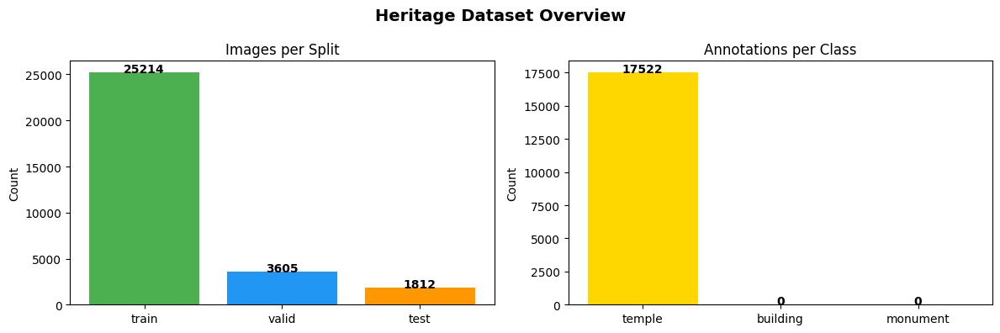

 Dataset overview plotted


In [4]:
# Show class distribution and sample images
split_counts = {}
label_counts = {c: 0 for c in UNIFIED_CLASSES}

for split in SPLITS:
    lbl_dir = MERGED_DIR / split / "labels"
    if not lbl_dir.exists():
        split_counts[split] = 0
        continue
    labels = list(lbl_dir.glob("*.txt"))
    split_counts[split] = len(labels)
    for lbl_file in labels:
        with open(lbl_file) as f:
            for line in f:
                line = line.strip()
                if line:
                    cls_id = int(line.split()[0])
                    if cls_id < len(UNIFIED_CLASSES):
                        label_counts[UNIFIED_CLASSES[cls_id]] += 1

fig, axes = plt.subplots(1, 2, figsize=(12, 4))
fig.suptitle("Heritage Dataset Overview", fontsize=14, fontweight="bold")

# Split distribution
axes[0].bar(split_counts.keys(), split_counts.values(),
            color=["#4CAF50", "#2196F3", "#FF9800"])
axes[0].set_title("Images per Split")
axes[0].set_ylabel("Count")
for i, (k, v) in enumerate(split_counts.items()):
    axes[0].text(i, v + 0.5, str(v), ha="center", fontweight="bold")

# Class distribution
axes[1].bar(label_counts.keys(), label_counts.values(),
            color=["#FFD700"])
axes[1].set_title("Annotations per Class")
axes[1].set_ylabel("Count")
for i, (k, v) in enumerate(label_counts.items()):
    axes[1].text(i, v + 0.5, str(v), ha="center", fontweight="bold")

plt.tight_layout()
plt.savefig(str(BASE_DIR / "dataset_overview.png"), dpi=120, bbox_inches="tight")
plt.show()
print(" Dataset overview plotted")


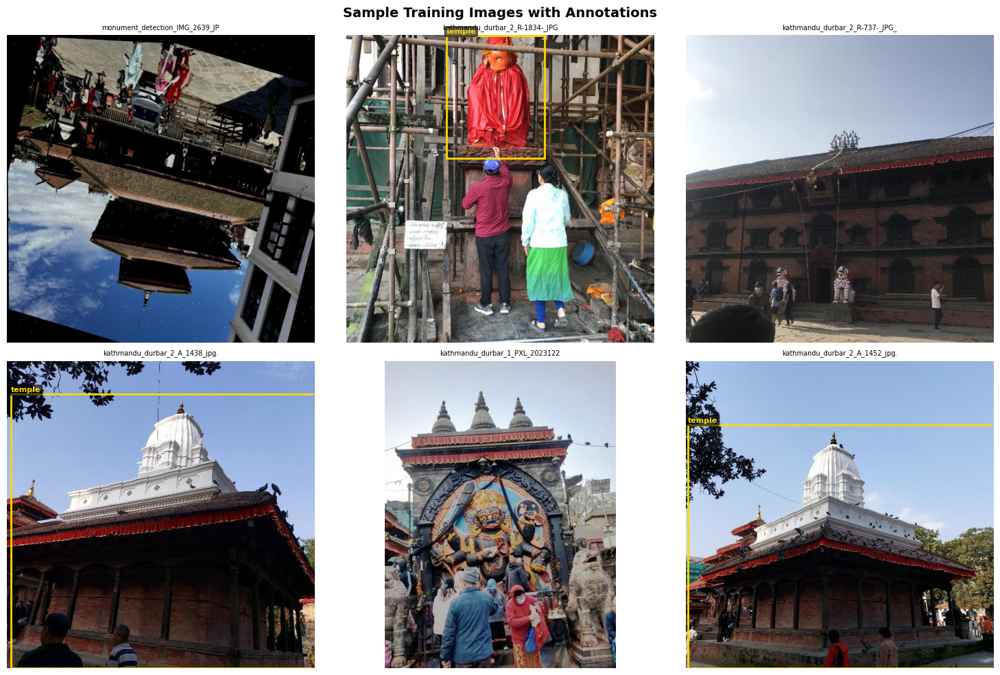

In [5]:
# Show a grid of sample training images with their annotations
def show_sample_images(n=6):
    img_dir = MERGED_DIR / "train" / "images"
    lbl_dir = MERGED_DIR / "train" / "labels"
    CLASS_COLORS = {"temple": "#FFD700"}

    img_paths = list(img_dir.glob("*.jpg"))[:n] + list(img_dir.glob("*.png"))[:n]
    img_paths = img_paths[:n]

    if not img_paths:
        print("No images found to display.")
        return

    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    fig.suptitle("Sample Training Images with Annotations", fontsize=14, fontweight="bold")
    axes = axes.flatten()

    for ax, img_path in zip(axes, img_paths):
        img_bgr = cv2.imread(str(img_path))
        if img_bgr is None:
            ax.axis("off")
            continue
        img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
        h, w    = img_rgb.shape[:2]
        ax.imshow(img_rgb)

        lbl_path = lbl_dir / (img_path.stem + ".txt")
        if lbl_path.exists():
            with open(lbl_path) as f:
                for line in f:
                    parts = line.strip().split()
                    if len(parts) < 5:
                        continue
                    cls_id = int(parts[0])
                    cx, cy, bw, bh = map(float, parts[1:5])
                    x1 = (cx - bw / 2) * w
                    y1 = (cy - bh / 2) * h
                    rect_w, rect_h = bw * w, bh * h
                    cls_name = UNIFIED_CLASSES[cls_id] if cls_id < len(UNIFIED_CLASSES) else "?"
                    color = CLASS_COLORS.get(cls_name, "white")
                    rect = patches.Rectangle((x1, y1), rect_w, rect_h,
                                             linewidth=2, edgecolor=color, facecolor="none")
                    ax.add_patch(rect)
                    ax.text(x1, y1 - 4, cls_name, color=color,
                            fontsize=8, fontweight="bold",
                            bbox=dict(boxstyle="round,pad=0.2", fc="black", alpha=0.6))
        ax.set_title(img_path.name[:30], fontsize=7)
        ax.axis("off")

    for ax in axes[len(img_paths):]:
        ax.axis("off")

    plt.tight_layout()
    plt.savefig(str(BASE_DIR / "sample_images.png"), dpi=120, bbox_inches="tight")
    plt.show()

show_sample_images()


In [8]:
device = [0, 1] if torch.cuda.is_available() else "cpu"
if torch.cuda.is_available():
    print(f" GPU : {torch.cuda.get_device_name(0)}")
    print(f"   VRAM: {torch.cuda.get_device_properties(0).total_memory/1e9:.1f} GB")
    print(f"   PyTorch : {torch.__version__}")
    print(f"   CUDA    : {torch.version.cuda}")
else:
    print("  No GPU detected")


 GPU : Tesla T4
   VRAM: 15.6 GB
   PyTorch : 2.10.0+cu128
   CUDA    : 12.8


In [19]:
os.environ["TORCH_DISTRIBUTED_DEBUG"] = "OFF"  # reduce noise

# Patch DDP before model.train() is called
from torch.nn.parallel import DistributedDataParallel as DDP
import ultralytics.engine.trainer as _ultralytics_trainer

_OriginalDDP = _ultralytics_trainer.torch.nn.parallel.DistributedDataParallel

def _PatchedDDP(module, **kwargs):
    kwargs.setdefault("find_unused_parameters", True)
    return _OriginalDDP(module, **kwargs)

_ultralytics_trainer.torch.nn.parallel.DistributedDataParallel = _PatchedDDP

# Now train normally with both T4s
# ── Augmentation strategy for geographic generalisation ──────────────────────
# The model must learn "temple" as a structural concept (spire, tiered roof,
# courtyard, ornate facade) NOT as a regional colour palette or material.
# Strong colour/tone jitter stops it memorising "red brick = Nepali temple".
# High scale variance + perspective teach it to fire at any distance/angle.
# Mosaic + mixup expose it to multiple architectural styles in one pass.
# ─────────────────────────────────────────────────────────────────────────────
results = model.train(
    data         = str(data_yaml_path),
    epochs       = EPOCHS,
    patience     = 20,
    imgsz        = IMAGE_SIZE,
    batch        = BATCH_SIZE * 2,
    optimizer    = "AdamW",
    lr0          = 0.001,
    lrf          = 0.01,
    momentum     = 0.937,
    weight_decay = 0.0005,
    warmup_epochs = 3.0,

    # ── Colour augmentation (break regional palette dependency) ───────────────
    hsv_h        = 0.05,   # wide hue shift: red brick ↔ white marble ↔ grey stone
    hsv_s        = 0.9,    # desaturate heavily → weathered/damaged temples included
    hsv_v        = 0.5,    # brightness range → dawn/dusk/overcast/interior shots

    # ── Geometry augmentation (learn structure, not framing) ──────────────────
    degrees      = 15.0,   # rotated tourist shots, drone angles
    translate    = 0.15,   # temple not always centred
    scale        = 0.6,    # distant temple in landscape vs close facade crop
    shear        = 3.0,    # perspective distortion from wide-angle lenses
    perspective  = 0.0005, # slight projective warp
    fliplr       = 0.5,    # symmetric architecture — flip is safe
    flipud       = 0.0,    # upside-down temples are not real

    # ── Multi-image mixing (expose to style diversity per batch) ──────────────
    mosaic       = 1.0,    # 4-image mosaic: Nepali + Thai + Indian + Cambodian in one sample
    mixup        = 0.15,   # alpha-blend two styles → forces feature-level generalisation
    copy_paste   = 0.1,    # paste temple crops onto new backgrounds

    # ── Loss weights ─────────────────────────────────────────────────────────
    box          = 9.0,    # tight localisation even on full-image fallback boxes
    cls          = 0.3,    # 1 class — minimise classification overhead
    dfl          = 1.5,
    max_det      = 20,

    device       = "0,1",
    project      = str(BASE_DIR / "outputs/runs"),
    name         = "heritage_detector",
    exist_ok     = True,
    plots        = True,
    save         = True,
    save_period  = 10,
    verbose      = True,
)

Ultralytics 8.4.51 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
                                                       CUDA:1 (Tesla T4, 14913MiB)
Overriding model.yaml nc=80 with nc=3
Transferred 349/355 items from pretrained weights
Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks...
AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1237.3±669.1 MB/s, size: 80.2 KB)
train: Scanning /kaggle/working/data/merged/train/labels.cache... 25214 images, 11510 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 25214/25214 2.6Git/s 0.0s
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1605.5±647.4 MB/s, size: 77.6 KB)
val: Scanning /kaggle/working/data/merged/valid/labels.cache... 3605 images, 1634 backgrou

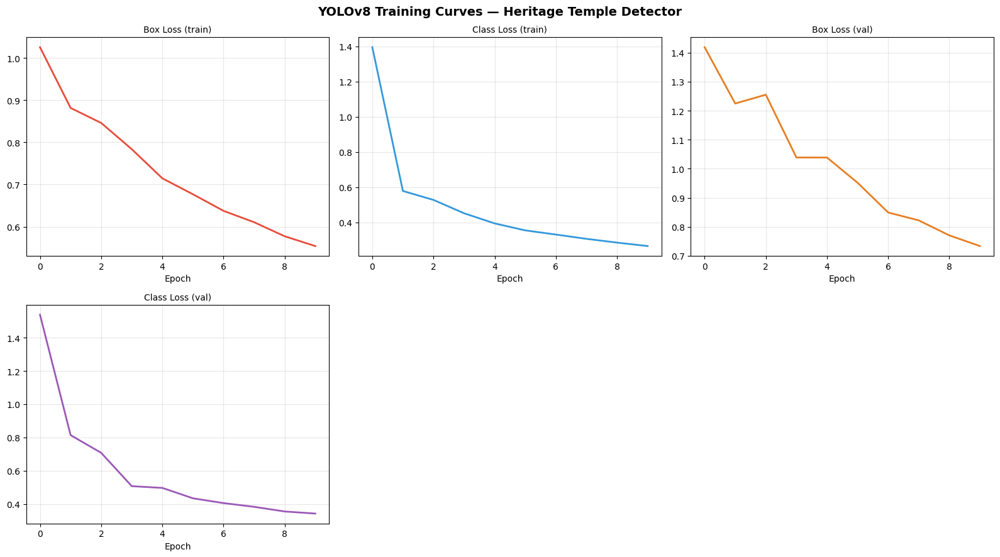


 Running validation on best weights ...
val: Scanning /kaggle/working/data/merged/valid/labels.cache... 3605 images, 1634 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 3605/3605 540.0Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 226/226 4.5it/s 49.7s<0.2s

 Validation Metrics (best.pt):
------------------------------
  mAP50       : 0.9935  ███████████████████
  mAP50-95    : 0.8192  ████████████████
  Precision   : 0.9816  ███████████████████
  Recall      : 0.9812  ███████████████████
------------------------------


In [20]:
run_dir    = BASE_DIR / "outputs/runs/heritage_detector"
best_pt    = run_dir / "weights/best.pt"
results_csv = run_dir / "results.csv"

# Plot training curves
if results_csv.exists():
    df = pd.read_csv(results_csv)
    df.columns = df.columns.str.strip()

    fig, axes = plt.subplots(2, 3, figsize=(16, 9))
    fig.suptitle("YOLOv8 Training Curves — Heritage Temple Detector", fontsize=14, fontweight="bold")

    plot_cols = [
        ("train/box_loss",  "Box Loss (train)",      "#E74C3C"),
        ("train/cls_loss",  "Class Loss (train)",    "#3498DB"),
        ("val/box_loss",    "Box Loss (val)",         "#E67E22"),
        ("val/cls_loss",    "Class Loss (val)",       "#9B59B6"),
        ("metrics/mAP50",   "mAP@50",                "#2ECC71"),
        ("metrics/mAP50-95","mAP@50-95",             "#1ABC9C"),
    ]

    for ax, (col, title, color) in zip(axes.flatten(), plot_cols):
        if col in df.columns:
            ax.plot(df[col], color=color, linewidth=2)
            ax.set_title(title, fontsize=10)
            ax.set_xlabel("Epoch")
            ax.grid(True, alpha=0.3)
        else:
            ax.set_visible(False)

    plt.tight_layout()
    plt.savefig(str(BASE_DIR / "training_curves.png"), dpi=120, bbox_inches="tight")
    plt.show()

# Validation metrics on best weights
if best_pt.exists():
    print("\n Running validation on best weights ...")
    best_model  = YOLO(str(best_pt))
    val_results = best_model.val(data=str(data_yaml_path), imgsz=IMAGE_SIZE, device=device)

    metrics = {
        "mAP50":     float(val_results.box.map50),
        "mAP50-95":  float(val_results.box.map),
        "Precision": float(val_results.box.mp),
        "Recall":    float(val_results.box.mr),
    }

    print("\n Validation Metrics (best.pt):")
    print("-" * 30)
    for k, v in metrics.items():
        bar = "█" * int(v * 20)
        print(f"  {k:12s}: {v:.4f}  {bar}")
    print("-" * 30)

    with open(BASE_DIR / "val_metrics.json", "w") as f:
        json.dump(metrics, f, indent=2)
else:
    print("  best.pt not found — check training output above")


In [21]:
PADDING_BY_CLASS = {"temple": 0.12}
DETECTOR = YOLO(str(best_pt))

def compute_padded_bbox(x_min, y_min, x_max, y_max, img_h, img_w, alpha):
    dw = int((x_max - x_min) * alpha)
    dh = int((y_max - y_min) * alpha)
    return (
        max(0,     x_min - dw),
        max(0,     y_min - dh),
        min(img_w, x_max + dw),
        min(img_h, y_max + dh),
    )

def detect_and_crop(img_path, output_root, conf=CONF_THRESHOLD):  # CONF_THRESHOLD=0.45; lower it in settings if damaged temples are missed
    img = cv2.imread(str(img_path))
    if img is None:
        return []
    img_h, img_w = img.shape[:2]

    results = DETECTOR.predict(source=str(img_path), conf=conf, iou=0.35,  # lower NMS iou → keep overlapping temples
                               verbose=False, save=False)
    detections = []
    if results[0].boxes is None:
        return []

    for i, box in enumerate(results[0].boxes):
        cls_id   = int(box.cls.item())
        cls_name = UNIFIED_CLASSES[cls_id] if cls_id < len(UNIFIED_CLASSES) else "unknown"
        conf_sc  = float(box.conf.item())
        # All classes are remapped to "temple" — no filter needed
        x1, y1, x2, y2 = box.xyxy[0].cpu().numpy().astype(int)
        alpha = PADDING_BY_CLASS.get(cls_name, 0.08)
        cx1, cy1, cx2, cy2 = compute_padded_bbox(x1, y1, x2, y2, img_h, img_w, alpha)

        crop = img[cy1:cy2, cx1:cx2]
        crop_dir = output_root / cls_name
        crop_dir.mkdir(parents=True, exist_ok=True)
        crop_name = f"{img_path.stem}_det{i:02d}_{conf_sc:.2f}.jpg"
        cv2.imwrite(str(crop_dir / crop_name), crop)

        detections.append({
            "class": cls_name, "conf": conf_sc,
            "detection_idx": i,                          # per-image detection index
            "bbox": (x1, y1, x2, y2), "crop_bbox": (cx1, cy1, cx2, cy2),
            "crop_path": crop_dir / crop_name,
        })
    return detections

# Run on all test images
test_img_dir = MERGED_DIR / "test" / "images"
test_imgs    = list(test_img_dir.glob("*.jpg")) + list(test_img_dir.glob("*.png"))

all_detections = []
total_temples  = 0

print(f"Running detection on {len(test_imgs)} test images ...\n")
for img_path in tqdm(test_imgs[:50], desc="Detecting"):   # cap at 50 for display
    dets = detect_and_crop(img_path, CROPS_DIR)
    total_temples += len(dets)
    all_detections.extend([(img_path, d) for d in dets])

print(f"\n Detection complete")
print(f"   Temples found : {total_temples}")
print(f"   Crops saved to: {CROPS_DIR}/temple/")


Running detection on 1812 test images ...



Detecting: 100%|██████████| 50/50 [00:01<00:00, 36.67it/s]


 Detection complete
   Temples found : 23
   Crops saved to: /kaggle/working/outputs/crops/temple/


Glyph 128993 (\N{LARGE YELLOW CIRCLE}) missing from font(s) DejaVu Sans.
Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
Glyph 128993 (\N{LARGE YELLOW CIRCLE}) missing from font(s) DejaVu Sans.
Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
Glyph 128993 (\N{LARGE YELLOW CIRCLE}) missing from font(s) DejaVu Sans.
Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.


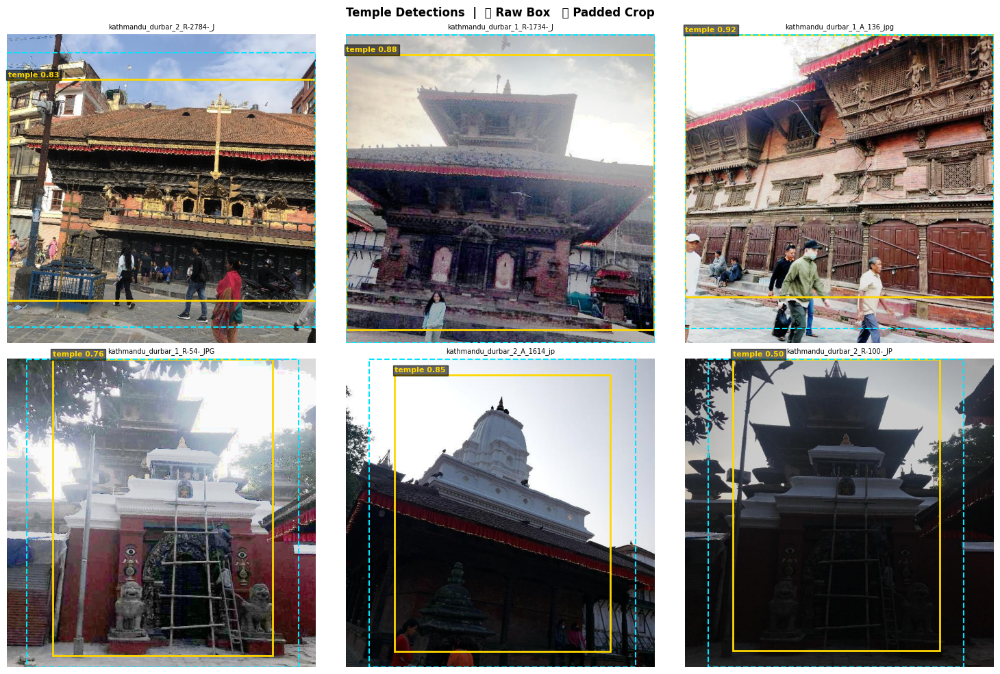

In [22]:
# Visualise detections — one subplot per detected temple (not per source image)
def visualise_single_detection(img_path, det, ax):
    img = cv2.imread(str(img_path))
    if img is None:
        ax.axis("off")
        return
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    ax.imshow(img_rgb)

    x1, y1, x2, y2 = det["bbox"]
    cx1, cy1, cx2, cy2 = det["crop_bbox"]
    det_idx = det["detection_idx"]

    # Count how many detections this source image has (for subtitle)
    # Raw detection box (solid gold)
    ax.add_patch(patches.Rectangle((x1, y1), x2-x1, y2-y1,
                 lw=2, edgecolor="#FFD700", facecolor="none"))
    # Padded crop box (dashed cyan)
    ax.add_patch(patches.Rectangle((cx1, cy1), cx2-cx1, cy2-cy1,
                 lw=1.5, edgecolor="#00E5FF", facecolor="none", linestyle="--"))
    # Label with detection index so multiple temples in one image are distinguished
    ax.text(x1, y1-5, f"temple #{det_idx}  {det['conf']:.2f}",
            color="#FFD700", fontsize=8, fontweight="bold",
            bbox=dict(fc="black", alpha=0.6, pad=2))
    ax.axis("off")

# Build per-image detection counts for titles
img_det_counts = {}
for img_path, det in all_detections:
    img_det_counts[img_path] = img_det_counts.get(img_path, 0) + 1

# Show up to 9 individual detections (each temple gets its own panel)
sample_pairs = all_detections[:9]
if sample_pairs:
    cols = min(3, len(sample_pairs))
    rows = (len(sample_pairs) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(5 * cols, 5 * rows))
    axes = [axes] if rows * cols == 1 else axes.flatten()

    for ax, (img_path, det) in zip(axes, sample_pairs):
        visualise_single_detection(img_path, det, ax)
        n_in_img = img_det_counts[img_path]
        title = f"{img_path.name[:22]}  |  det #{det['detection_idx']+1}/{n_in_img}"
        ax.set_title(title, fontsize=7)

    for ax in axes[len(sample_pairs):]:
        ax.axis("off")

    plt.suptitle(
        f"Temple Detections  |  🟡 Raw Box   🔵 Padded Crop"
        f"  |  {len(all_detections)} total detections across {len(img_det_counts)} images",
        fontsize=11, fontweight="bold"
    )
    plt.tight_layout()
    plt.savefig(str(BASE_DIR / "detections_overview.png"), dpi=120, bbox_inches="tight")
    plt.show()

    # Summary: images that had multiple temples detected
    multi = {p: n for p, n in img_det_counts.items() if n > 1}
    if multi:
        print(f"\n  Images with multiple temple detections: {len(multi)}")
        for p, n in sorted(multi.items(), key=lambda x: -x[1])[:10]:
            print(f"    {p.name[:40]:42s}  {n} temples")
    else:
        print("  Each image had at most 1 temple detected.")
else:
    print("No detections to visualise on test set.")


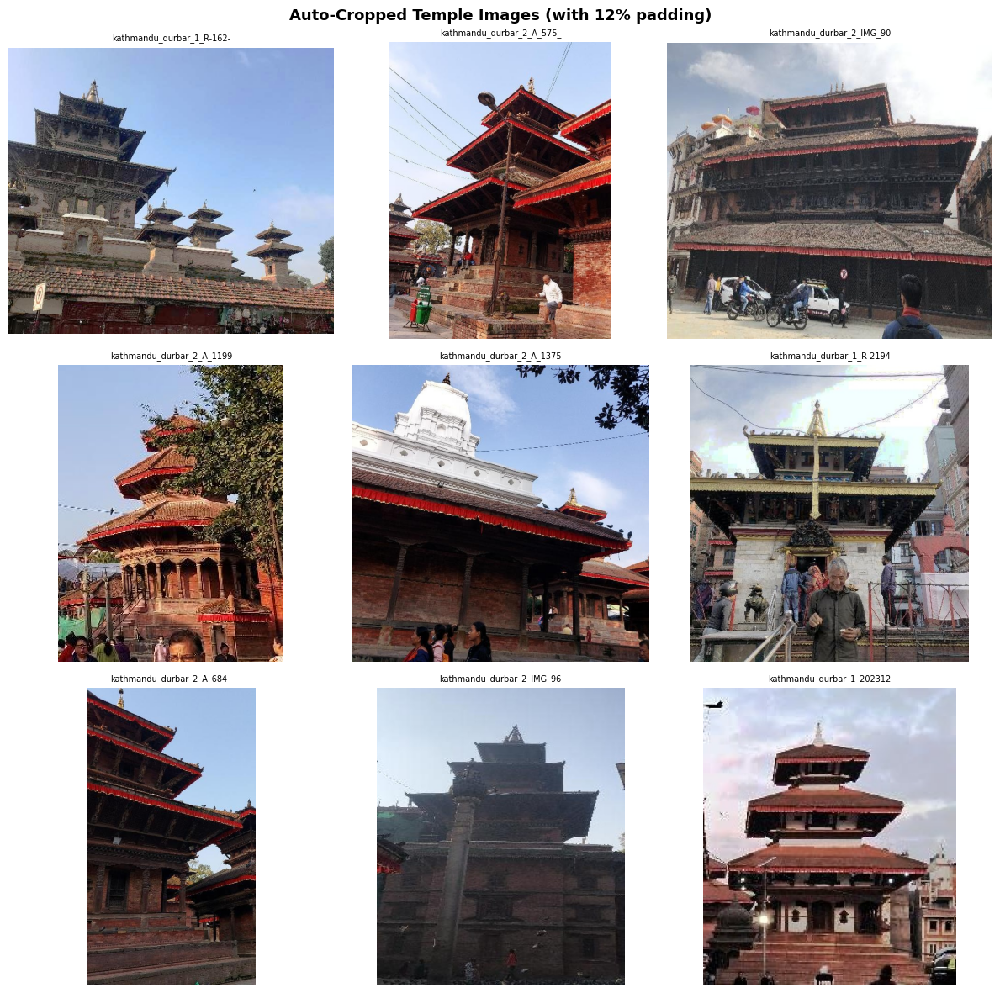

In [24]:
# Display a grid of the actual cropped temple images,
# with title showing source image and which detection index it came from.
# Crop filenames encode: {stem}_det{idx:02d}_{conf:.2f}.jpg
crop_imgs = list((CROPS_DIR / "temple").glob("*.jpg"))
# Sort by source image then detection index
def crop_sort_key(p):
    parts = p.stem.rsplit("_det", 1)
    stem = parts[0]
    idx_conf = parts[1] if len(parts) > 1 else "00_0.00"
    idx = int(idx_conf.split("_")[0])
    return (stem, idx)

crop_imgs_sorted = sorted(crop_imgs, key=crop_sort_key)[:12]

if crop_imgs_sorted:
    cols = 4
    rows = (len(crop_imgs_sorted) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(4 * cols, 4 * rows))
    fig.suptitle(
        f"Auto-Cropped Temple Detections (12% padding)  |  {len(crop_imgs)} total crops",
        fontsize=12, fontweight="bold"
    )
    axes = axes.flatten()

    for ax, cp in zip(axes, crop_imgs_sorted):
        img = cv2.imread(str(cp))
        if img is not None:
            ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        # Parse detection index from filename
        parts = cp.stem.rsplit("_det", 1)
        src_stem = parts[0][-18:] if len(parts[0]) > 18 else parts[0]
        idx_str = parts[1] if len(parts) > 1 else "?"
        idx_num = idx_str.split("_")[0]
        conf_str = idx_str.split("_")[1] if "_" in idx_str else "?"
        ax.set_title(f"{src_stem}\nTemple #{int(idx_num)+1}  conf={conf_str}", fontsize=6.5)
        ax.axis("off")

    for ax in axes[len(crop_imgs_sorted):]:
        ax.axis("off")

    plt.tight_layout()
    plt.savefig(str(BASE_DIR / "cropped_temples.png"), dpi=120, bbox_inches="tight")
    plt.show()
    print(f"  {len(crop_imgs)} total temple crops saved to {CROPS_DIR}/temple/")
else:
    print("No cropped temple images found — check CROPS_DIR")


In [34]:
# ── Damage assessment ────────────────────────────────────────────────────────
DAMAGE_CLASSES = {0: "crack", 1: "spalling", 2: "exposed_core", 3: "deformation"}
SEVERITY_WEIGHTS = {"crack": 1.5, "spalling": 1.0, "exposed_core": 1.8, "deformation": 2.0}

def evaluate_structural_integrity(raw_ratio, weighted_ratio, deformation):
    if deformation:
        return ("CRITICAL", "#FF0000", "Structural Deformation — Immediate Intervention Required")
    if weighted_ratio > 40.0 or raw_ratio > 35.0:
        return ("CRITICAL", "#FF0000", "Severe Damage — Immediate Structural Intervention Required")
    elif weighted_ratio > 25.0 or raw_ratio > 18.0:
        return ("MODERATE", "#FF8C00", "Active Deterioration — Schedule Restoration Within 6 Months")
    elif weighted_ratio > 10.0 or raw_ratio > 6.0:
        return ("MINOR",    "#FFD700", "Surface Deterioration — Monitor & Plan Maintenance")
    else:
        return ("STABLE",   "#00C851", "No Significant Damage Detected")

# Rule-based fallback (works without a trained damage model)
def rule_based_damage_estimate(img_path):
    img  = cv2.imread(str(img_path))
    if img is None:
        return {"raw_ratio": 0, "weighted_ratio": 0, "deformation": False, "damage_pixels": {}}
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    h, w = gray.shape
    total_px = h * w

    # tighter Canny + morphological cleanup
    edges    = cv2.Canny(gray, 100, 200)
    kernel   = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    edges    = cv2.morphologyEx(edges, cv2.MORPH_OPEN, kernel)
    edge_px  = int(edges.sum() / 255)

    # spalling — higher threshold, cleanup
    blur      = cv2.GaussianBlur(gray, (15, 15), 0)
    diff      = cv2.absdiff(gray, blur)
    _, thresh = cv2.threshold(diff, 50, 255, cv2.THRESH_BINARY)
    thresh    = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel)
    spall_px  = int(thresh.sum() / 255)

    raw_ratio      = min(100, (edge_px + spall_px) / total_px * 100)
    weighted_ratio = min(100, (edge_px * 1.5 + spall_px * 1.0) / total_px * 100)

    return {
        "raw_ratio":      raw_ratio,
        "weighted_ratio": weighted_ratio,
        "deformation":    False,
        "damage_pixels":  {"crack_proxy": edge_px, "spalling_proxy": spall_px},
    }

# Try to load a damage model if one exists, else use rule-based
DAMAGE_MODEL_PATH = BASE_DIR / "damage_model.pt"
damage_model = None
if DAMAGE_MODEL_PATH.exists():
    damage_model = YOLO(str(DAMAGE_MODEL_PATH))
    print("Damage model loaded:", DAMAGE_MODEL_PATH)
else:
    print("  No damage_model.pt found — using rule-based fallback analysis")
    print("   To use a trained model: upload damage_model.pt to /kaggle/working/")

crop_imgs_to_assess = list((CROPS_DIR / "temple").glob("*.jpg"))
print(f"\nAssessing {len(crop_imgs_to_assess)} cropped temple images ...")


  No damage_model.pt found — using rule-based fallback analysis
   To use a trained model: upload damage_model.pt to /kaggle/working/

Assessing 23 cropped temple images ...


In [35]:
damage_reports = []
for img_path in tqdm(crop_imgs_to_assess, desc="Assessing damage"):
    if damage_model:
        results    = damage_model.predict(source=str(img_path), conf=0.30,
                                          verbose=False, save=False)[0]
        img        = cv2.imread(str(img_path))
        h, w       = img.shape[:2]
        total_px   = h * w
        dmg_px     = {n: 0 for n in DAMAGE_CLASSES.values()}
        boxes      = []

        if results.boxes is not None:
            for i, box in enumerate(results.boxes):
                cls_id  = int(box.cls.item())
                cls_nm  = DAMAGE_CLASSES.get(cls_id, "unknown")
                if cls_nm not in dmg_px:
                    continue
                x1, y1, x2, y2 = box.xyxy[0].cpu().numpy().astype(int)
                conf_sc = float(box.conf.item())
                dmg_px[cls_nm] += max(0, x2-x1) * max(0, y2-y1)
                boxes.append({"cls": cls_nm, "conf": conf_sc, "xyxy": (x1, y1, x2, y2)})

        total_dmg      = sum(dmg_px.values())
        raw_ratio      = total_dmg / total_px * 100
        weighted_ratio = sum(dmg_px[c] * SEVERITY_WEIGHTS.get(c, 1.0)
                             for c in dmg_px) / total_px * 100
        deformation    = dmg_px.get("deformation", 0) > 0
    else:
        r              = rule_based_damage_estimate(img_path)
        raw_ratio      = r["raw_ratio"]
        weighted_ratio = r["weighted_ratio"]
        deformation    = r["deformation"]
        boxes          = []

    grade, color, detail = evaluate_structural_integrity(raw_ratio, weighted_ratio, deformation)
    damage_reports.append({
        "image":        img_path.name,
        "img_path":     img_path,
        "raw_pct":      round(raw_ratio, 3),
        "weighted_pct": round(weighted_ratio, 3),
        "deformation":  deformation,
        "grade":        grade,
        "color":        color,
        "detail":       detail,
        "boxes":        boxes,
    })

# Save reports (exclude non-serialisable fields)
with open(REPORT_DIR / "damage_report.json", "w") as f:
    json.dump([{k: v for k, v in r.items()
                if k not in ("boxes", "img_path")} for r in damage_reports], f, indent=2)

with open(REPORT_DIR / "damage_summary.csv", "w", newline="") as f:
    w = csv.DictWriter(f, fieldnames=["image","raw_pct","weighted_pct","grade","detail"])
    w.writeheader()
    for r in damage_reports:
        w.writerow({k: r[k] for k in ["image","raw_pct","weighted_pct","grade","detail"]})

print(f"\n Damage assessment complete — {len(damage_reports)} temples assessed")

Assessing damage: 100%|██████████| 23/23 [00:00<00:00, 128.61it/s]


 Damage assessment complete — 23 temples assessed


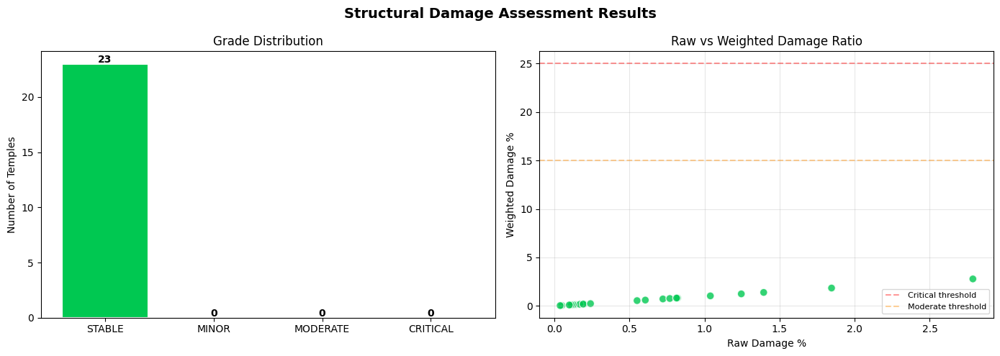

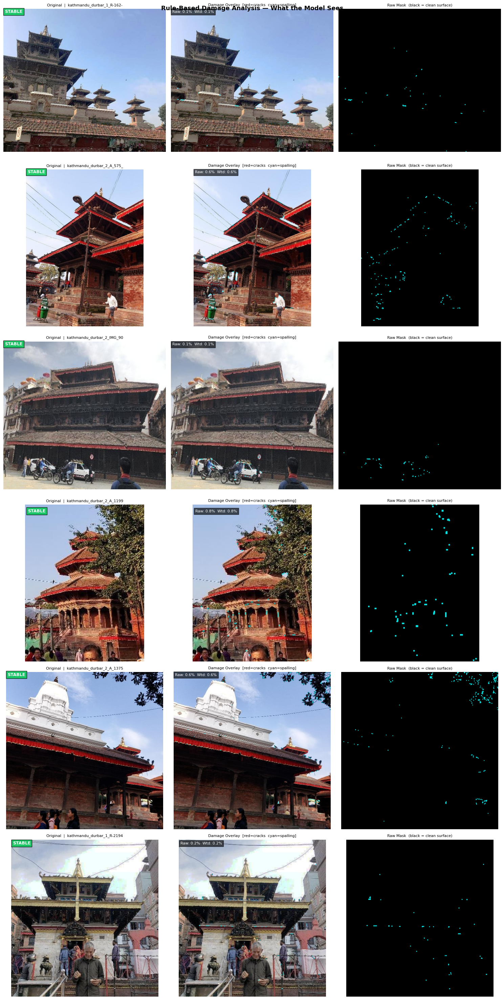


 Grade Summary:
  STABLE    :  23  ███████████████████████
  MINOR     :   0  
  MODERATE  :   0  
  CRITICAL  :   0  


In [36]:
if damage_reports:
    GRADE_COLORS  = {"STABLE": "#00C851", "MINOR": "#FFD700",
                     "MODERATE": "#FF8C00", "CRITICAL": "#FF0000"}
    DAMAGE_COLORS = {"crack": "#FF4444", "spalling": "#FF8C00",
                     "exposed_core": "#FF00FF", "deformation": "#FF0000"}

    grade_counts  = Counter(r["grade"] for r in damage_reports)
    grades        = ["STABLE", "MINOR", "MODERATE", "CRITICAL"]
    counts        = [grade_counts.get(g, 0) for g in grades]
    colors        = [GRADE_COLORS[g] for g in grades]

    # ── chart row ─────────────────────────────────────────────────────────────
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    fig.suptitle("Structural Damage Assessment Results", fontsize=14, fontweight="bold")

    bars = axes[0].bar(grades, counts, color=colors, edgecolor="white", linewidth=1.5)
    axes[0].set_title("Grade Distribution")
    axes[0].set_ylabel("Number of Temples")
    for bar, count in zip(bars, counts):
        axes[0].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.1,
                     str(count), ha="center", fontweight="bold")

    raw_vals      = [r["raw_pct"]      for r in damage_reports]
    weighted_vals = [r["weighted_pct"] for r in damage_reports]
    pt_colors     = [GRADE_COLORS.get(r["grade"], "grey") for r in damage_reports]
    axes[1].scatter(raw_vals, weighted_vals, c=pt_colors, s=60, alpha=0.8, edgecolors="white")
    axes[1].set_xlabel("Raw Damage %")
    axes[1].set_ylabel("Weighted Damage %")
    axes[1].set_title("Raw vs Weighted Damage Ratio")
    axes[1].axhline(25, color="#FF0000", linestyle="--", alpha=0.4, label="Critical threshold")
    axes[1].axhline(15, color="#FF8C00", linestyle="--", alpha=0.4, label="Moderate threshold")
    axes[1].legend(fontsize=8)
    axes[1].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.savefig(str(BASE_DIR / "damage_results.png"), dpi=120, bbox_inches="tight")
    plt.show()

    # ── rule-based damage visualisation ──────────────────────────────────────
    sample_reports = damage_reports[:6]

    fig2, axes2 = plt.subplots(len(sample_reports), 3,
                               figsize=(15, 5 * len(sample_reports)))
    fig2.suptitle("Rule-Based Damage Analysis — What the Model Sees",
                  fontsize=13, fontweight="bold")

    if len(sample_reports) == 1:
        axes2 = [axes2]

    for row_ax, report in zip(axes2, sample_reports):
        img_path = report["img_path"]
        img      = cv2.imread(str(img_path))
        img_rgb  = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        gray     = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # tighter thresholds to reduce false positives on ornate carvings
        edges    = cv2.Canny(gray, 100, 200)
        blur     = cv2.GaussianBlur(gray, (15, 15), 0)
        diff     = cv2.absdiff(gray, blur)
        _, spall = cv2.threshold(diff, 50, 255, cv2.THRESH_BINARY)

        # morphological cleanup — remove isolated noise pixels
        kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
        edges  = cv2.morphologyEx(edges, cv2.MORPH_OPEN, kernel)
        spall  = cv2.morphologyEx(spall, cv2.MORPH_OPEN, kernel)

        overlay = img_rgb.copy()
        overlay[edges > 0] = [255, 60,  60]   # red  = crack proxy
        overlay[spall > 0] = [0,   230, 230]  # cyan = spalling proxy
        blended = cv2.addWeighted(img_rgb, 0.45, overlay, 0.55, 0)

        grade       = report["grade"]
        grade_color = GRADE_COLORS[grade]

        # col 0: original crop
        row_ax[0].imshow(img_rgb)
        row_ax[0].set_title(f"Original  |  {report['image'][:25]}", fontsize=8)
        row_ax[0].text(5, 15, grade, color="white", fontsize=9, fontweight="bold",
                       bbox=dict(fc=grade_color, alpha=0.85, pad=3))
        row_ax[0].axis("off")

        # col 1: damage overlay
        row_ax[1].imshow(blended)
        row_ax[1].set_title("Damage Overlay  [red=cracks  cyan=spalling]", fontsize=8)
        row_ax[1].text(5, 15,
                       f"Raw: {report['raw_pct']:.1f}%  Wtd: {report['weighted_pct']:.1f}%",
                       color="white", fontsize=8,
                       bbox=dict(fc="black", alpha=0.65, pad=3))
        row_ax[1].axis("off")

        # col 2: raw mask only
        combined_mask = np.zeros((*gray.shape, 3), dtype=np.uint8)
        combined_mask[edges > 0] = [255, 60,  60]
        combined_mask[spall > 0] = [0,   230, 230]
        row_ax[2].imshow(combined_mask)
        row_ax[2].set_title("Raw Mask  (black = clean surface)", fontsize=8)
        row_ax[2].axis("off")

    plt.tight_layout()
    plt.savefig(str(BASE_DIR / "damage_masks.png"), dpi=120, bbox_inches="tight")
    plt.show()

    print("\n Grade Summary:")
    for grade in grades:
        n   = grade_counts.get(grade, 0)
        bar = "█" * n
        print(f"  {grade:10s}: {n:3d}  {bar}")

In [29]:

def zip_dir(source_dir, zip_path, prefix=""):
    with zipfile.ZipFile(zip_path, "w", zipfile.ZIP_DEFLATED) as zf:
        for file in Path(source_dir).rglob("*"):
            if file.is_file():
                zf.write(file, prefix + "/" + file.name)
    return zip_path

# 1. Best model weights
best_dst = BASE_DIR / "heritage_detector_best.pt"
if best_pt.exists():
    shutil.copy2(best_pt, best_dst)
    print(f" Best weights → {best_dst}")

# 2. Cropped temple images
crops_zip = BASE_DIR / "temple_crops.zip"
if (CROPS_DIR / "temple").exists():
    zip_dir(CROPS_DIR / "temple", crops_zip, prefix="temple_crops")
    print(f" Temple crops → {crops_zip}")

# 3. Damage reports
reports_zip = BASE_DIR / "damage_reports.zip"
if REPORT_DIR.exists():
    zip_dir(REPORT_DIR, reports_zip, prefix="reports")
    print(f" Damage reports → {reports_zip}")

# 4. Training plots
plots_src = BASE_DIR / "outputs/runs/heritage_detector"
plots_zip = BASE_DIR / "training_plots.zip"
if plots_src.exists():
    with zipfile.ZipFile(plots_zip, "w", zipfile.ZIP_DEFLATED) as zf:
        for f in plots_src.glob("*.png"):
            zf.write(f, f.name)
    print(f" Training plots → {plots_zip}")

# List all output files
print("\n All output files in /kaggle/working/:")
for f in sorted(BASE_DIR.glob("*.*")):
    size_mb = f.stat().st_size / 1e6
    print(f"   {f.name:45s}  {size_mb:.2f} MB")


 Best weights → /kaggle/working/heritage_detector_best.pt
 Temple crops → /kaggle/working/temple_crops.zip
 Damage reports → /kaggle/working/damage_reports.zip
 Training plots → /kaggle/working/training_plots.zip

 All output files in /kaggle/working/:
   .virtual_documents                             0.00 MB
   architecture_comparison.png                    0.06 MB
   attention_Constitutional_Law.png               0.07 MB
   attention_General_Law.png                      0.05 MB
   attention_Tax_Law.png                          0.05 MB
   best_model_phase1_enhanced.pth                 282.49 MB
   best_model_phase2_enhanced.pth                 282.49 MB
   confusion_matrices.png                         0.10 MB
   confusion_matrix.png                           0.04 MB
   cropped_temples.png                            2.48 MB
   damage_reports.zip                             0.00 MB
   damage_results.png                             0.07 MB
   dataset_overview.png                        